In [1]:
# -*- coding:utf-8 -*-
import math,os,collections
import numpy as np
import pandas as pd
import multiprocessing as mp
import matplotlib.pyplot as plt
import pyqt_fit.nonparam_regression as smooth
from pyqt_fit import npr_methods
import warnings
warnings.filterwarnings('ignore')

In [2]:
GENOMIC_FEATURES_DIR = '/Users/emmanueldollinger/PycharmProjects/prediction_by_k/DATA/Genomic_Features/'
EACH_SUB_FIG_SIZE = 5

In [3]:
def mkdir(dir_path):
    if not os.path.exists(dir_path):
        os.makedirs(dir_path)

In [4]:
def plot_local_regression_and_RD():
    ChrmoHMM_labels = ["Active_Promoter", "Weak_Promoter", "Poised_Promoter", "Strong_Enhancer_1", "Strong_Enhancer_2","Weak_Enhancer_1", "Weak_Enhancer_2","Insulator","Txn_Transition","Txn_Elongation","Weak_Txn","Repressed","Heterochrom","Repetitive_1","Repetitive_2"]
    regions = ["ChrmoHMM", "ADDED", "General", "Genomic_Regions", "Histone_Modification", "Histone_Modification_Enzyme","TFBS"]#
    k_or_methy = ['Methy', 'K']#
    N_COL = 5
    MAX_D = 2000
    cm = plt.get_cmap('gist_rainbow')
    FIG_DIR = os.path.join("../FIGURES/Correlation_Analysis/")
    for REGION in regions:
        for km in k_or_methy:
            fig_dir = os.path.join(FIG_DIR, km)
            mkdir(fig_dir)
            out_rd_corr_dir = os.path.join(GENOMIC_FEATURES_DIR, REGION, km + "_RD")
            k_rd_dir = os.path.join(GENOMIC_FEATURES_DIR, REGION, "K_RD")
            methy_rd_dir = os.path.join(GENOMIC_FEATURES_DIR, REGION, "Methy_RD")
            file_labels = []
            file_paths = []
            if REGION == "ChrmoHMM":
                for chrmo_hmm_name in ChrmoHMM_labels:
                    RD_path = os.path.join(out_rd_corr_dir, chrmo_hmm_name + ".csv")
                    k_rd_path = os.path.join(k_rd_dir, chrmo_hmm_name + ".csv")
                    methy_rd_path = os.path.join(methy_rd_dir, chrmo_hmm_name + ".csv")
                    if os.path.exists(k_rd_path) and os.path.exists(methy_rd_path):
                        file_labels.append(chrmo_hmm_name)
                        file_paths.append(RD_path)
            else:
                for file_name in sorted(os.listdir(out_rd_corr_dir)):
                    if file_name.endswith(".csv"):
                        RD_path = os.path.join(out_rd_corr_dir, file_name)
                        k_rd_path = os.path.join(k_rd_dir, file_name)
                        methy_rd_path = os.path.join(methy_rd_dir, file_name)
                        if os.path.exists(k_rd_path) and os.path.exists(methy_rd_path):
                            file_paths.append(RD_path)
                            file_labels.append(file_name.strip(".csv"))
            fig_fp = os.path.join(fig_dir,  REGION + ".png")

            N_FILES = len(file_labels)
            N_ROW = int(math.ceil(float(N_FILES) / N_COL))
            print(N_ROW)
            fig, axs = plt.subplots(N_ROW, N_COL, figsize=(N_COL * EACH_SUB_FIG_SIZE, N_ROW * EACH_SUB_FIG_SIZE))
            for j in range(N_FILES):
                row = j // N_COL
                col = j % N_COL
                if N_ROW == 1:
                    ax = axs[col]
                else:
                    ax = axs[row][col]
                file_path = file_paths[j]
                RD_df = pd.read_csv(file_path, sep="\t", header=None).values
                ds = RD_df[:, 0]
                corrs = RD_df[:, 1]
                k0 = smooth.NonParamRegression(ds, corrs, method=npr_methods.LocalPolynomialKernel(q=3))
                k0.fit()
                ax.plot(ds, corrs, 'o', alpha=0.5, color=cm(1. * j / N_FILES), markersize=4)
                ax.plot(ds, k0(ds), linewidth=2)
                ax.set_xticks(range(0, MAX_D + 1, 400))
                ax.set_xlim(0, MAX_D)
                ax.set_ylim(0, 1.0)
                ax.set_title(file_labels[j], fontsize=12)
            plt.savefig(fig_fp, dpi=200)
            plt.show()

3


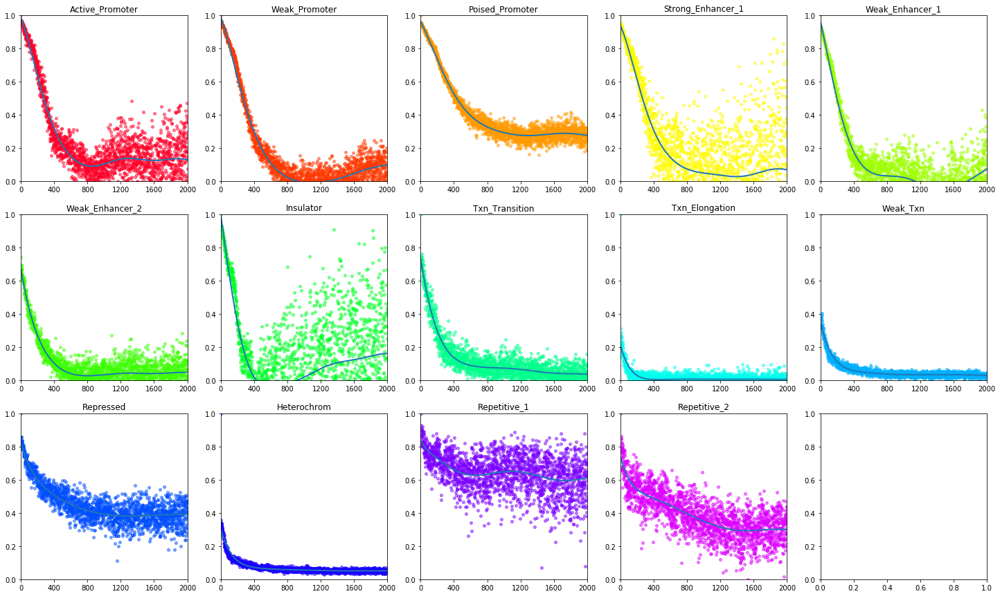

3


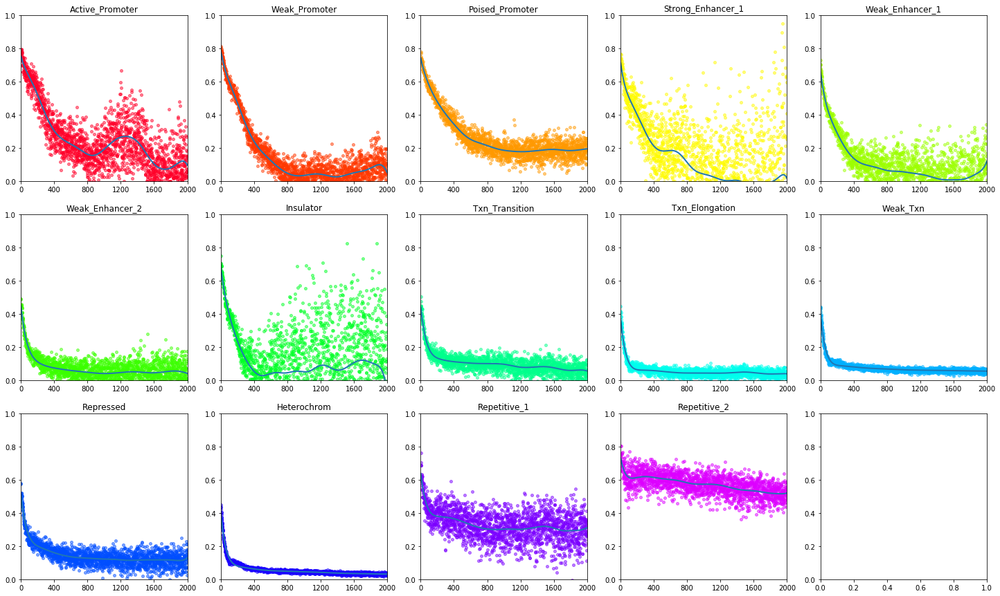

4


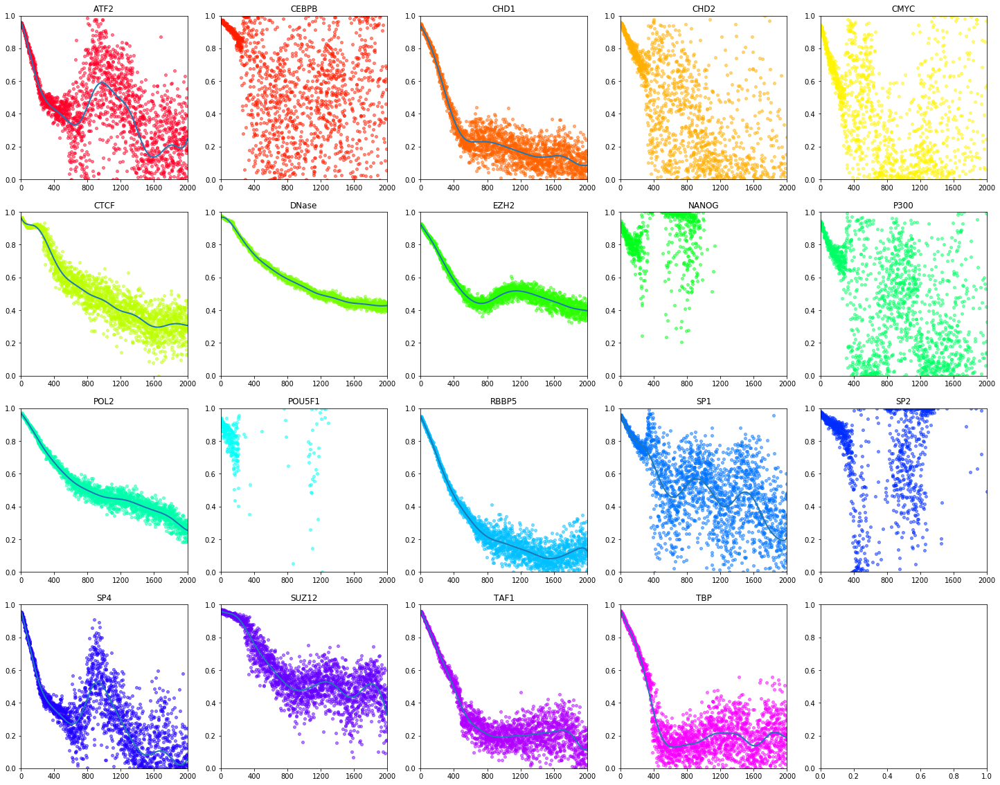

4


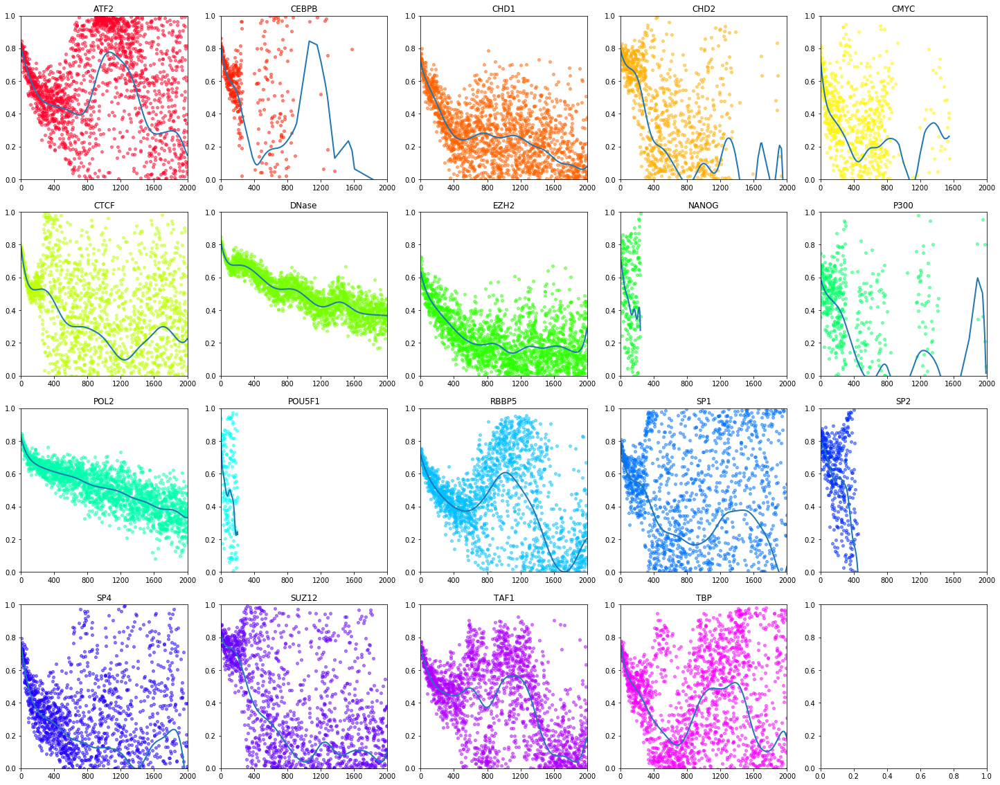

1


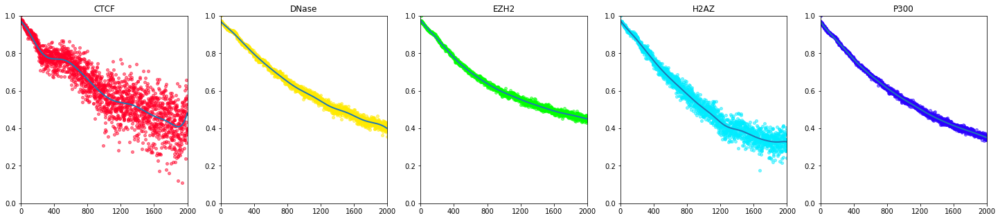

1


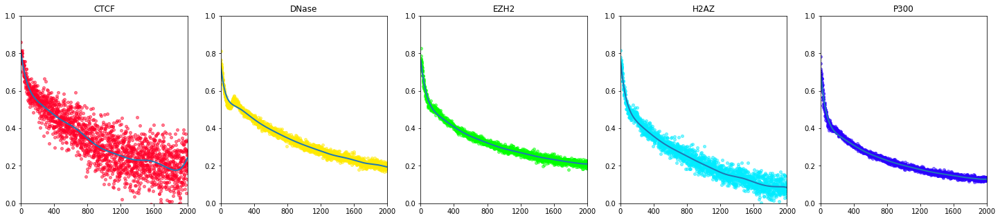

3


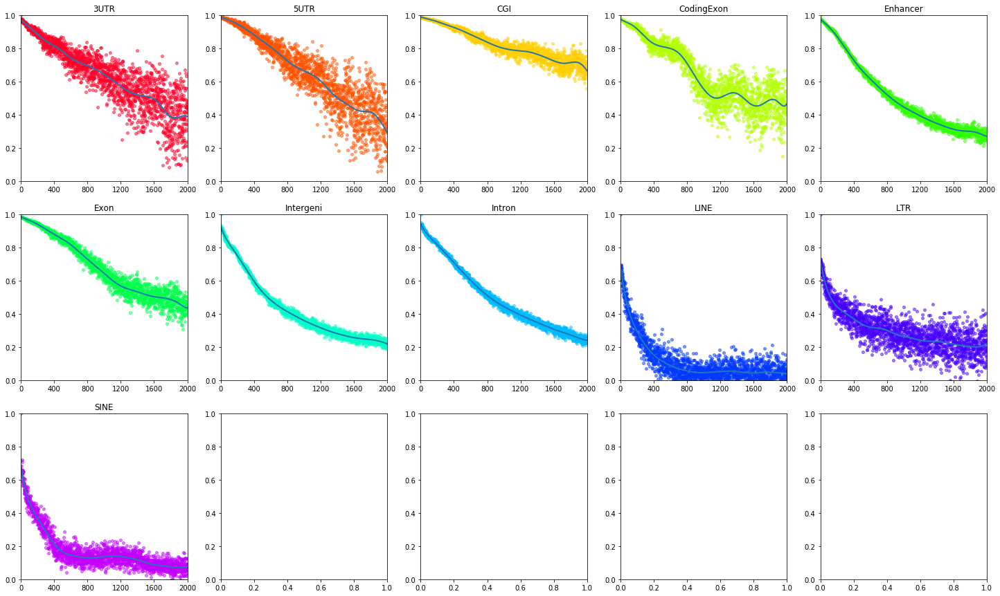

3


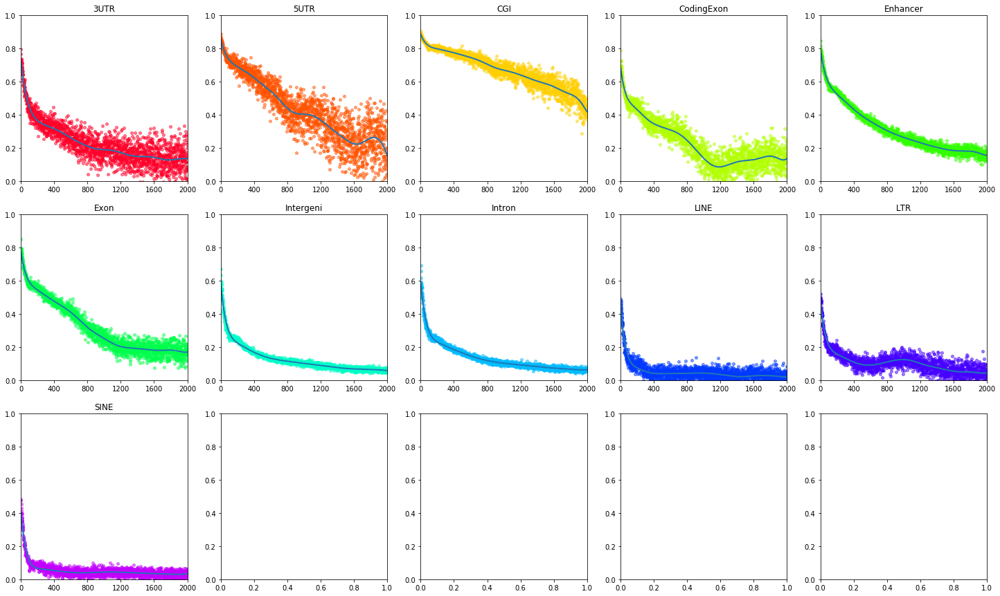

2


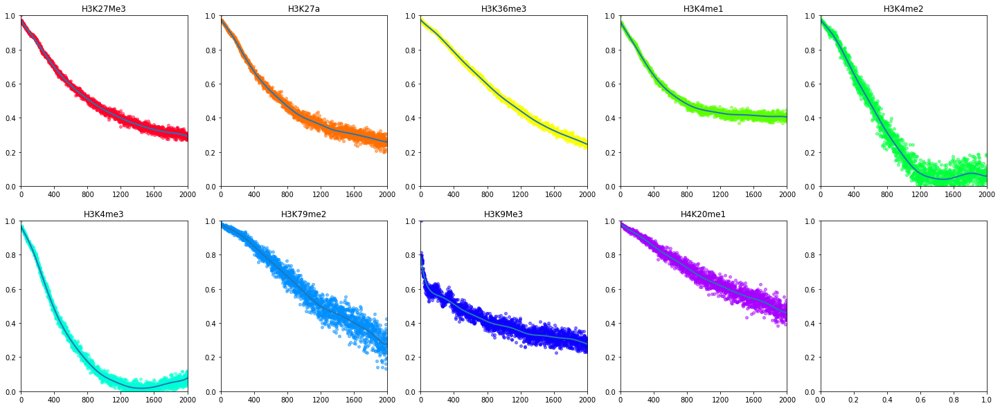

2


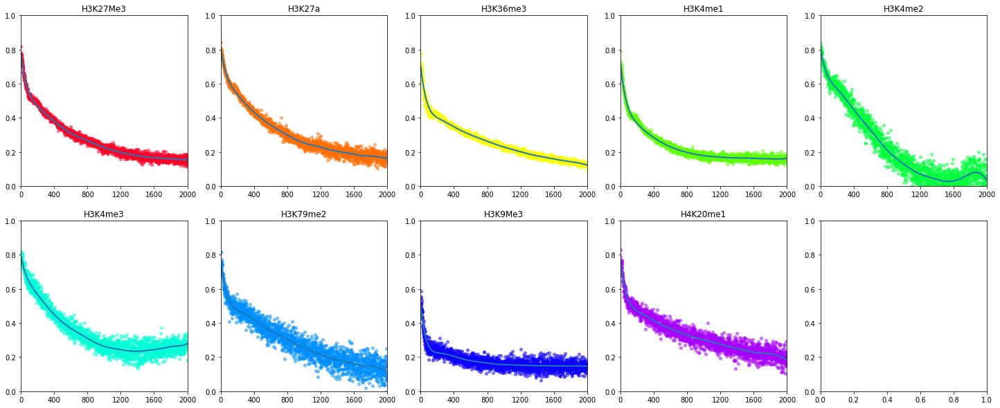

2


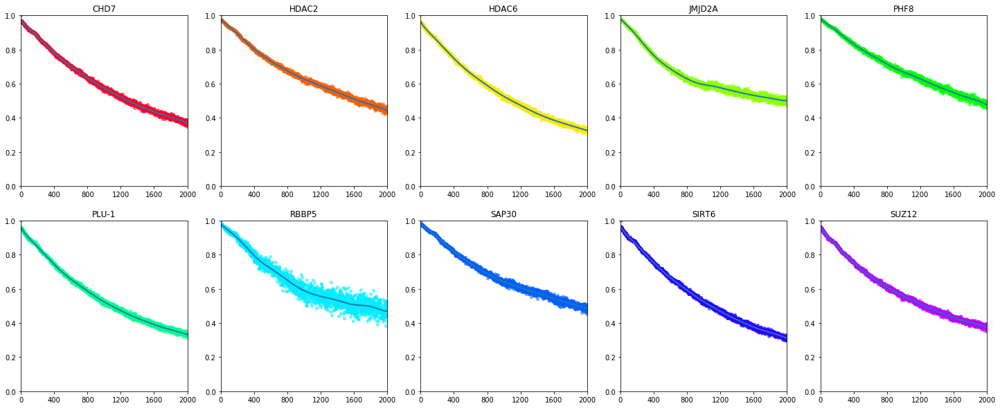

2


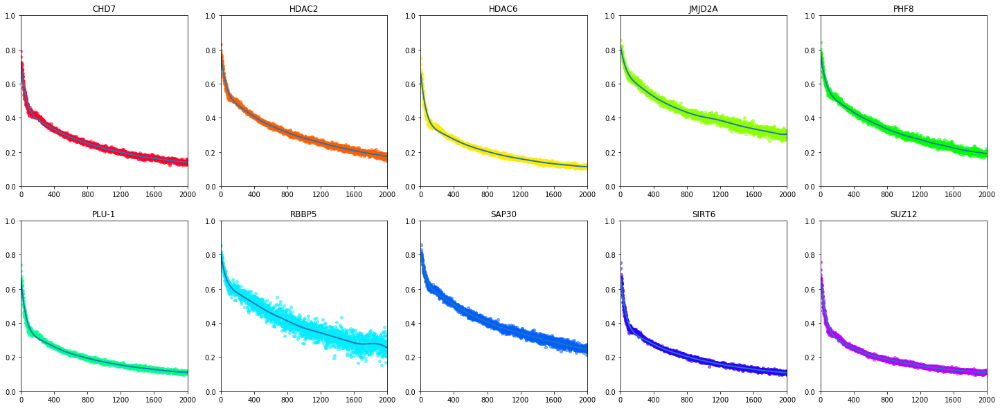

32


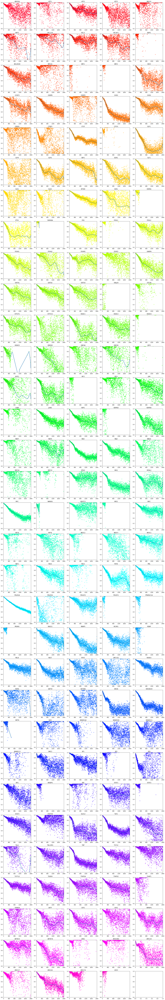

32


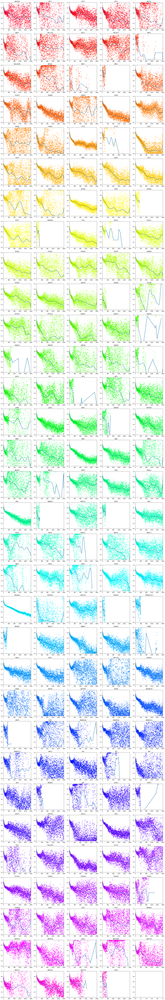

In [5]:
plot_local_regression_and_RD()